In [1]:
import sys
print(sys.executable)
!conda info | grep 'active env'

/sc/arion/work/massen06/.conda/envs/qc_torch/bin/python3.9
     active environment : scvi
    active env location : /sc/arion/work/massen06/.conda/envs/scvi


In [2]:
import logging
logger = logging.getLogger("numba")
logger.setLevel(logging.ERROR)

In [3]:
import os
import copy
import pge
import anndata as ad
import scanpy as sc
import pandas as pd
import pegasus as pg
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import median_abs_deviation
from datetime import datetime

/sc/arion/work/massen06/.conda/envs/qc_torch/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/sc/arion/work/massen06/.conda/envs/qc_torch/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/sc/arion/work/massen06/.conda/envs/qc_torch/lib/pyt

scanpy==1.9.3 anndata==0.9.2 umap==0.5.3 numpy==1.24.4 scipy==1.11.1 pandas==2.0.3 scikit-learn==1.3.0 statsmodels==0.14.0 python-igraph==0.9.10 louvain==0.7.2 pynndescent==0.5.10


# Mouse Living Brain - QC and Annotation
Nicolas Masse, Donghoon Lee  
July 2023

### Load AnnData into Pegasus

In [4]:
mouse_mitocarta_fn = "MouseMitoCarta3.0.csv" 
save_dir = "/sc/arion/work/massen06/living_brain1/anndata"
anndata_fn = os.path.join(save_dir, "mouse_living_brain_filtered.h5ad")

In [5]:
data = pg.read_input(anndata_fn)

2023-08-07 10:19:07,123 - pegasusio.readwrite - INFO - h5ad file '/sc/arion/work/massen06/living_brain1/anndata/mouse_living_brain_filtered.h5ad' is loaded.
2023-08-07 10:19:07,124 - pegasusio.readwrite - INFO - Function 'read_input' finished in 1.04s.


### Identify robust genes and remove genes with low expression

In [6]:
### identify robust genes
pg.identify_robust_genes(data, percent_cells=0.05)

### remove features that are not robust (expressed at least 0.05% of cells) from downstream analysis
data._inplace_subset_var(data.var['robust'])

2023-08-07 10:19:08,793 - pegasus.tools.preprocessing - INFO - After filtration, 37440/56481 genes are kept. Among 37440 genes, 23741 genes are robust.
2023-08-07 10:19:08,794 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 1.66s.


### Add gene descriptions

In [7]:
### add ribosomal genes
data.var['ribosomal'] = [x.startswith("RP") for x in data.var.gene_name]

### add mitochondrial genes
data.var['mitochondrial'] = [x.startswith("mt-") for x in data.var.gene_name]

### add protein_coding genes
data.var['protein_coding'] = [x=='protein_coding' for x in data.var.gene_type]

# TODO: find mouse equivalent
### define mitocarta_genes
mitocarta = pd.read_csv(mouse_mitocarta_fn)
data.var['mitocarta_genes'] = [True if x in list(mitocarta.Symbol) else False for x in data.var.gene_name]

### define robust_protein_coding genes (exclude ribosomal (RPL,RPS), mitochondrial, or mitocarta genes
data.var['robust_protein_coding'] = data.var['robust'] & data.var['protein_coding']
data.var.loc[data.var.ribosomal, 'robust_protein_coding'] = False
data.var.loc[data.var.mitochondrial, 'robust_protein_coding'] = False
data.var.loc[data.var.mitocarta_genes, 'robust_protein_coding'] = False

### show
data.var[data.var['robust_protein_coding']]

,gene_name,gene_type,gene_id,gene_chrom,gene_start,gene_end,n_cells,percent_cells,robust,highly_variable_features,ribosomal,mitochondrial,protein_coding,mitocarta_genes,robust_protein_coding
featurekey,,,,,,,,,,,,,,,
Pcmtd1,Pcmtd1,protein_coding,ENSMUSG00000051285,1,7159144.0,7243852.0,29912,37.064297,True,True,False,False,True,False,True
Cdh7,Cdh7,protein_coding,ENSMUSG00000026312,1,109910161.0,110067887.0,11904,14.750381,True,True,False,False,True,False,True
Exo1,Exo1,protein_coding,ENSMUSG00000039748,1,175708147.0,175741055.0,249,0.308539,True,True,False,False,True,False,True
Uxs1,Uxs1,protein_coding,ENSMUSG00000057363,1,43786126.0,43866960.0,21076,26.115510,True,True,False,False,True,False,True
Cdh19,Cdh19,protein_coding,ENSMUSG00000047216,1,110816056.0,110905314.0,9181,11.376281,True,True,False,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Smndc1,Smndc1,protein_coding,ENSMUSG00000025024,19,53367821.0,53379009.0,4965,6.152188,True,True,False,False,True,False,True
Papss2,Papss2,protein_coding,ENSMUSG00000024899,19,32573190.0,32644587.0,2591,3.210537,True,True,False,False,True,False,True
Pten,Pten,protein_coding,ENSMUSG00000013663,19,32734897.0,32803560.0,37430,46.379936,True,True,False,False,True,False,True


### Determine the upper and lower ranges of genes per cell, and number of cells with expression for each gene

In [8]:
pg.qc_metrics(data)

In [9]:
### nUMI and nGene QCs
n_genes_lower, n_genes_upper = pge.qc_boundary(data.obs.n_genes, k=3)
n_counts_lower, n_counts_upper = pge.qc_boundary(data.obs.n_counts, k=3)

print('genes lower: %d upper: %d' % (n_genes_lower, n_genes_upper))
print('UMIs lower: %d upper: %d' % (n_counts_lower, n_counts_upper))

n_genes_upper = 15000
n_counts_upper = 200000

print('genes lower: %d upper: %d' % (n_genes_lower, n_genes_upper))
print('UMIs lower: %d upper: %d' % (n_counts_lower, n_counts_upper))

genes lower: 302 upper: 7729
UMIs lower: 317 upper: 29703
genes lower: 302 upper: 15000
UMIs lower: 317 upper: 200000


/sc/arion/work/massen06/.conda/envs/qc_torch/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/sc/arion/work/massen06/.conda/envs/qc_torch/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


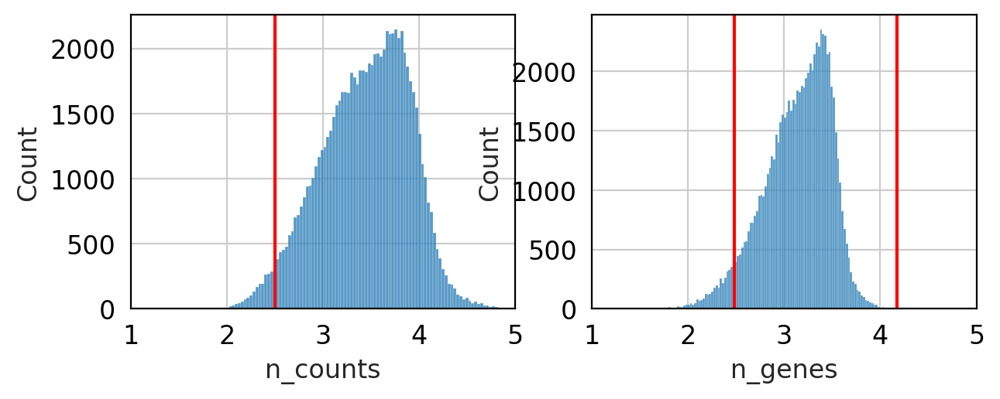

In [10]:
f, ax = plt.subplots(1, 2, figsize=(7,2.5))

# Library size (millions) VS. Number of cells
sns.histplot(np.log10(data.obs.n_counts), ax=ax[0])
ax[0].axvline(np.log10(n_counts_lower), color='red')
ax[0].axvline(np.log10(n_counts_upper), color='red')
ax[0].set_xlim([1, 5])

# number of genes per cells
sns.histplot(np.log10(data.obs.n_genes), ax=ax[1])
ax[1].axvline(np.log10(n_genes_lower), color='red')
ax[1].axvline(np.log10(n_genes_upper), color='red')
ax[1].set_xlim([1, 5])

plt.show()

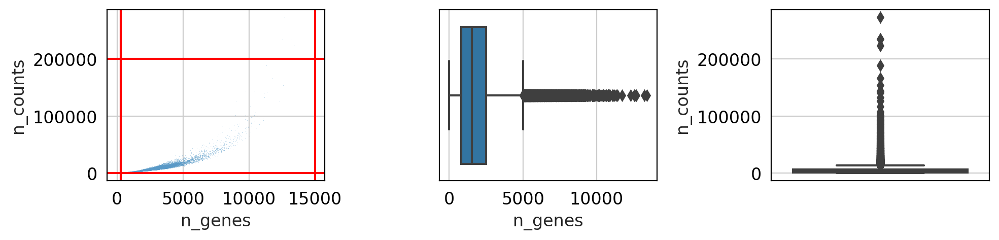

In [11]:
f, ax = plt.subplots(1, 3, figsize=(10,2.5))
sns.scatterplot(x=data.obs.n_genes, y=data.obs.n_counts, alpha=0.5, s=0.1, ax=ax[0])

# gene
ax[0].axvline(n_genes_lower, color='red')
ax[0].axvline(n_genes_upper, color='red')

# umi
ax[0].axhline(n_counts_lower, color='red')
ax[0].axhline(n_counts_upper, color='red')

sns.boxplot(x=data.obs.n_genes, ax=ax[1])

sns.boxplot(y=data.obs.n_counts, ax=ax[2])

plt.tight_layout()
plt.show()

In [12]:
## FILTER QC
pg.qc_metrics(
    data, 
    min_genes=n_genes_lower, 
    max_genes=n_genes_upper,
    min_umis=n_counts_lower, 
    max_umis=n_counts_upper,
    mito_prefix='mt-', 
    percent_mito=1,
)


### Percent Mito

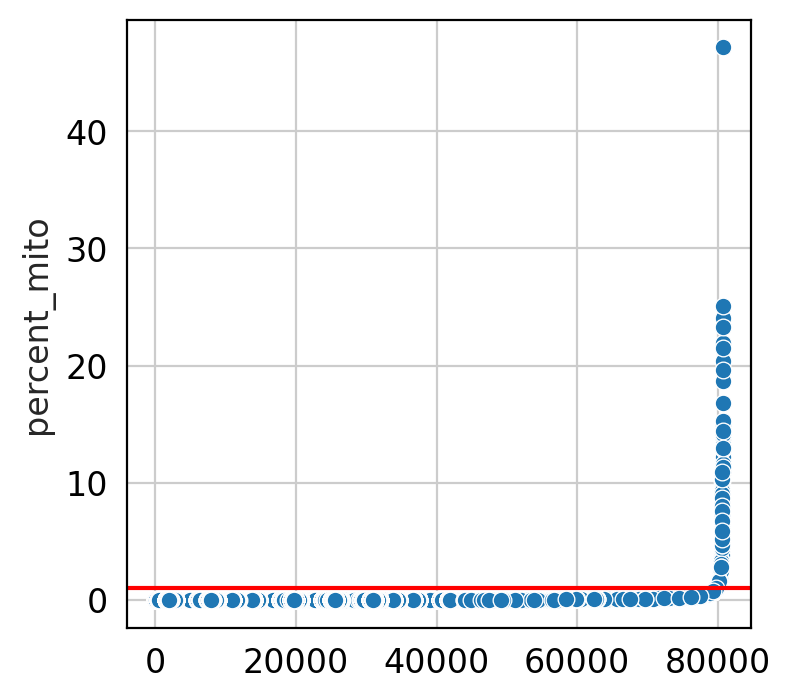

In [13]:
percent_mito = data.obs.percent_mito

temp = percent_mito.argsort()
ranks = np.empty_like(temp)
ranks[temp] = np.arange(len(percent_mito))

sns.scatterplot(x=ranks, y=percent_mito)
plt.axhline(1, color='red')
plt.show()

### Donor QC
Visualize how many cells come from each donor, and from each donor/living condition

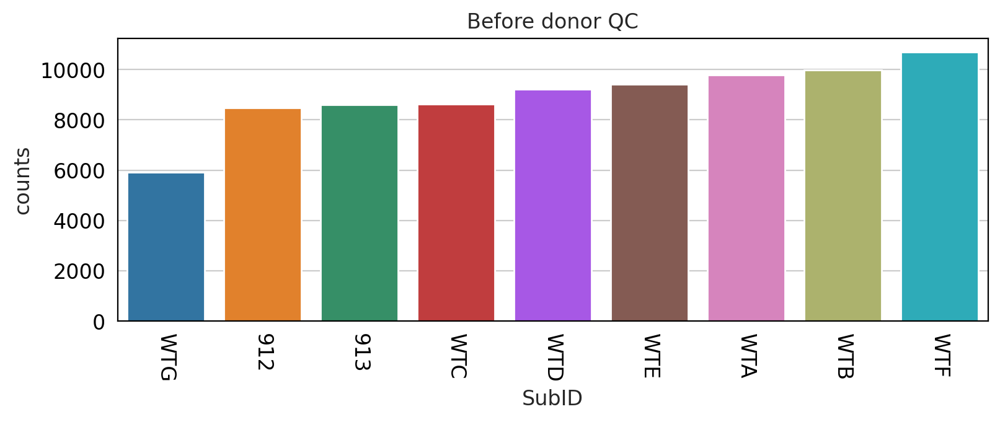

Number of cells before QC: 80703.0
Average number of cells per sample before QC:  8967.0




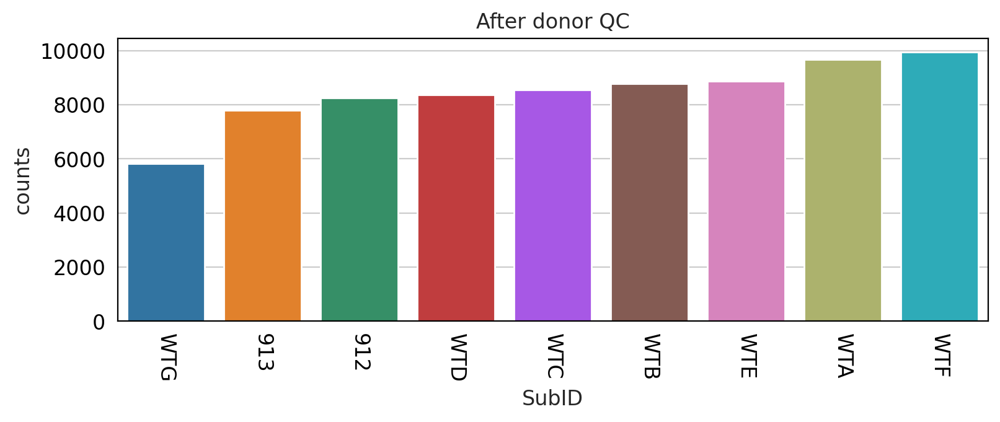

Number of cells after QC: 76020.0
Average number of cells per sample after QC:  8446.7


In [14]:
### before QC
donor_summary = data.obs.SubID.value_counts().rename_axis('SubID').reset_index(name='counts')

plt.figure(figsize=(9, 3))
sns.barplot(x='SubID', y='counts', data=donor_summary[:], order=donor_summary[:].sort_values('counts').SubID)
plt.xticks(rotation=-90)
plt.title("Before donor QC")
plt.show()

print(f'Number of cells before QC: {np.sum(donor_summary[donor_summary.counts>0].counts):7.1f}')
print(f'Average number of cells per sample before QC: {np.mean(donor_summary[donor_summary.counts>0].counts):7.1f}')
print()
print()

### after QC
donor_summary = data.obs[data.obs.passed_qc].SubID.value_counts().rename_axis('SubID').reset_index(name='counts')

plt.figure(figsize=(9, 3))
sns.barplot(x='SubID', y='counts', data=donor_summary[:], order=donor_summary[:].sort_values('counts').SubID)
plt.xticks(rotation=-90)
plt.title("After donor QC")
plt.show()
print(f'Number of cells after QC: {np.sum(donor_summary[donor_summary.counts>0].counts):7.1f}')
print(f'Average number of cells per sample after QC: {np.mean(donor_summary[donor_summary.counts>0].counts):7.1f}')


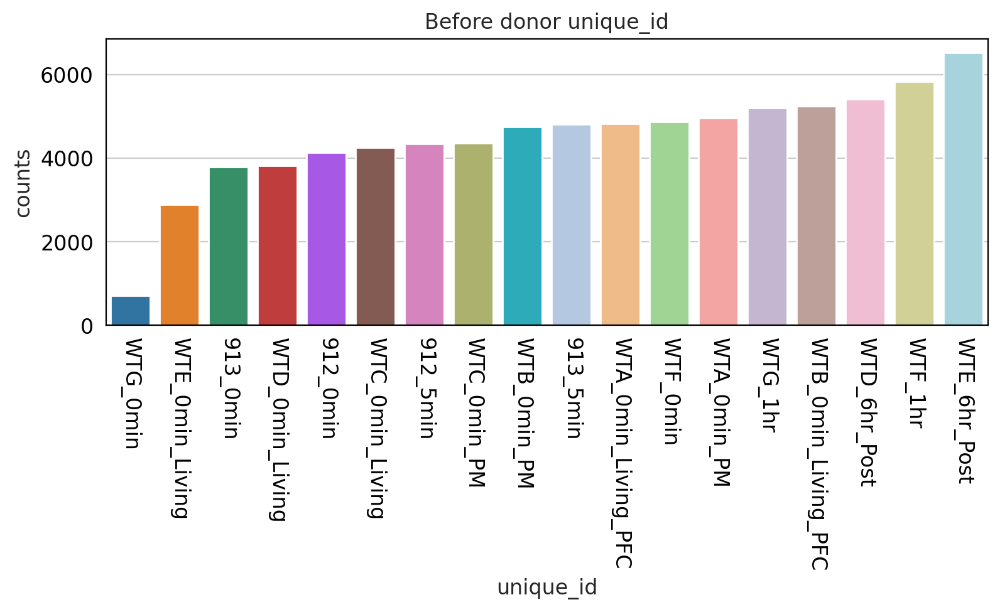

Number of cells before QC: 80703.0
Average number of cells per sample before QC:  4483.5




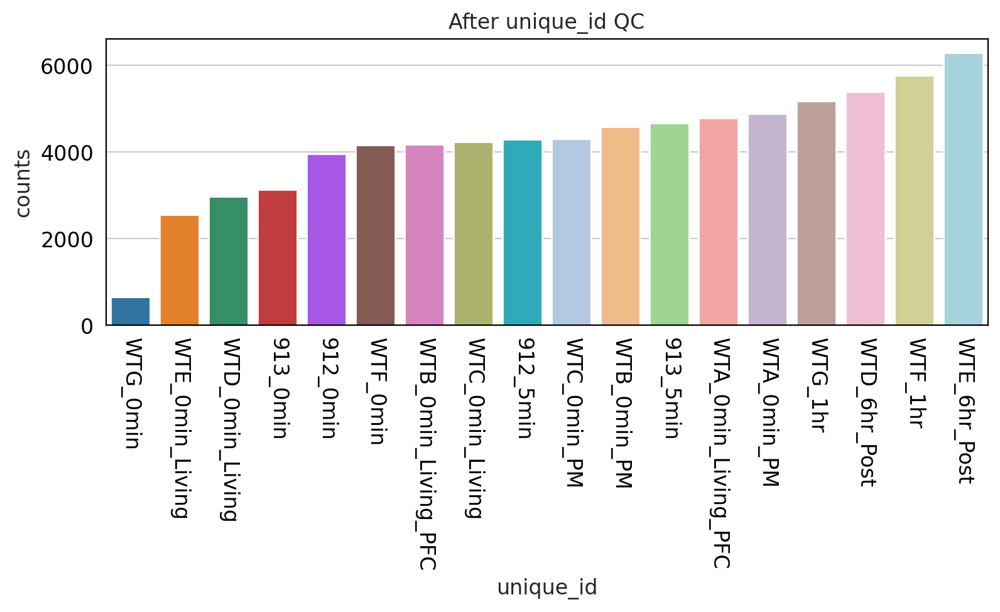

Number of cells after QC: 76020.0
Average number of cells per sample after QC:  4223.3


In [15]:
### before QC
donor_summary = data.obs.unique_id.value_counts().rename_axis('unique_id').reset_index(name='counts')

plt.figure(figsize=(9, 3))
sns.barplot(x='unique_id', y='counts', data=donor_summary[:], order=donor_summary[:].sort_values('counts').unique_id)
plt.xticks(rotation=-90)
plt.title("Before donor unique_id")
plt.show()

print(f'Number of cells before QC: {np.sum(donor_summary[donor_summary.counts>0].counts):7.1f}')
print(f'Average number of cells per sample before QC: {np.mean(donor_summary[donor_summary.counts>0].counts):7.1f}')
print()
print()

### after QC
donor_summary = data.obs[data.obs.passed_qc].unique_id.value_counts().rename_axis('unique_id').reset_index(name='counts')

plt.figure(figsize=(9, 3))
sns.barplot(x='unique_id', y='counts', data=donor_summary[:], order=donor_summary[:].sort_values('counts').unique_id)
plt.xticks(rotation=-90)
plt.title("After unique_id QC")
plt.show()
print(f'Number of cells after QC: {np.sum(donor_summary[donor_summary.counts>0].counts):7.1f}')
print(f'Average number of cells per sample after QC: {np.mean(donor_summary[donor_summary.counts>0].counts):7.1f}')

### Remove donor WTG

In [16]:
data.obs.passed_qc *= (data.obs.SubID != "WTG")

### Filter the data, normalize and apply the shifted logarithm

In [17]:
print(f"Percentage of cells that pass QC: {np.mean(data.obs.passed_qc):1.4f}")
print(f"Number of cells that pass QC: {np.sum(data.obs.passed_qc)}")
pg.filter_data(data)

Percentage of cells that pass QC: 0.8698
Number of cells that pass QC: 70195
2023-08-07 10:19:18,679 - pegasusio.qc_utils - INFO - After filtration, 70195 out of 80703 cell barcodes are kept in UnimodalData object unknown-rna.
2023-08-07 10:19:18,680 - pegasus.tools.preprocessing - INFO - Function 'filter_data' finished in 0.54s.


In [18]:
pg.identify_robust_genes(data)

2023-08-07 10:19:20,173 - pegasus.tools.preprocessing - INFO - After filtration, 23741/23741 genes are kept. Among 23741 genes, 23651 genes are robust.
2023-08-07 10:19:20,174 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 0.73s.


In [19]:
pg.normalize(data, norm_count=1e4)

2023-08-07 10:19:21,466 - pegasus.tools.preprocessing - INFO - Function 'normalize' finished in 0.81s.


In [20]:
pg.log1p(data, base_matrix="counts.norm")

2023-08-07 10:19:21,978 - pegasus.tools.preprocessing - INFO - Function 'log1p' finished in 0.51s.


### Clustering with number of neighbors = 30
Using Pegasus method to determine highly variable features

In [21]:
pg.highly_variable_features(data, batch='SubID', n_top=2000)
data.var.highly_variable_features *= data.var.protein_coding
data.var.highly_variable_features *= data.var.robust_protein_coding
data.var.highly_variable_features *= (data.var.ribosomal == False)
data.var.highly_variable_features *= (data.var.mitochondrial == False)
data.var.highly_variable_features *= (data.var.mitocarta_genes == False)

2023-08-07 10:19:23,642 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.66s.
2023-08-07 10:19:24,215 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2023-08-07 10:19:24,215 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 1.23s.


In [22]:
pg.pca(data, n_components=30, features='highly_variable_features', standardize=True)

2023-08-07 10:19:41,319 - pegasus.tools.preprocessing - INFO - Function 'pca' finished in 15.88s.


In [23]:
pg.neighbors(data, K=30, rep='pca')

2023-08-07 10:19:53,036 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 11.70s.
2023-08-07 10:19:54,295 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 1.26s.


In [24]:
pg.leiden(data, rep='pca', resolution=0.5, class_label="leiden_05")

2023-08-07 10:19:54,834 - pegasus.tools.graph_operations - INFO - Function 'construct_graph' finished in 0.53s.
2023-08-07 10:20:00,649 - pegasus.tools.clustering - INFO - Leiden clustering is done. Get 21 clusters.
2023-08-07 10:20:00,682 - pegasus.tools.clustering - INFO - Function 'leiden' finished in 6.38s.


### Remove doublets

/sc/arion/work/massen06/.conda/envs/qc_torch/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


2023-08-07 10:21:12,759 - pegasus.tools.doublet_detection - INFO - Sample : doublet threshold = 0.5285; total cells = 70195; neotypic doublet rate in simulation = 70.76%; neotypic doublet rate = 14.45%.
2023-08-07 10:21:13,422 - pegasus.tools.doublet_detection - INFO - Function '_run_scrublet' finished in 72.73s.
2023-08-07 10:21:14,174 - pegasus.tools.doublet_detection - INFO - Doublets are predicted!
2023-08-07 10:21:14,175 - pegasus.tools.doublet_detection - INFO - Function 'infer_doublets' finished in 73.49s.


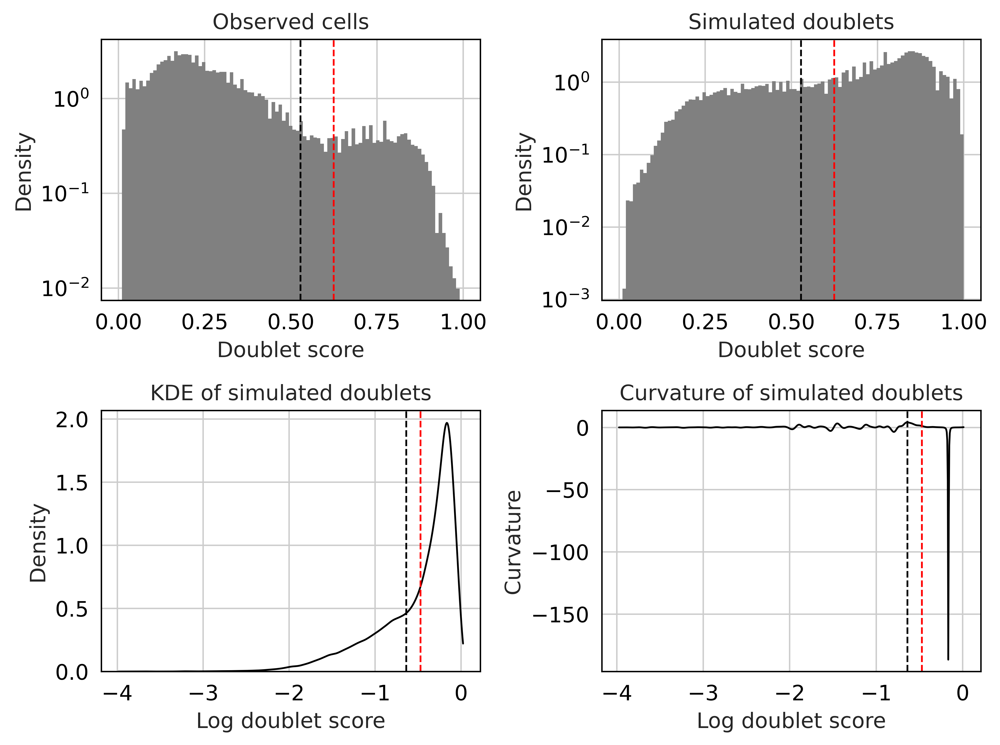

In [25]:
pg.infer_doublets(data, clust_attr = 'leiden_05') 

In [26]:
data.obs["passed_qc"] = ~data.obs.pred_dbl

In [27]:
print(f"Percentage of cells that pass QC: {np.mean(data.obs.passed_qc):1.4f}")
print(f"Number of cells that pass QC: {np.sum(data.obs.passed_qc)}")
pg.filter_data(data)

Percentage of cells that pass QC: 0.8555
Number of cells that pass QC: 60050
2023-08-07 10:21:17,320 - pegasusio.qc_utils - INFO - After filtration, 60050 out of 70195 cell barcodes are kept in UnimodalData object unknown-rna.
2023-08-07 10:21:17,321 - pegasus.tools.preprocessing - INFO - Function 'filter_data' finished in 1.13s.


### Visualize data after doublet removal (but before Harmony batch correction)

In [28]:
pg.highly_variable_features(data, batch='SubID', n_top=2000)
data.var.highly_variable_features *= data.var.protein_coding
data.var.highly_variable_features *= data.var.robust_protein_coding
data.var.highly_variable_features *= (data.var.ribosomal == False)
data.var.highly_variable_features *= (data.var.mitochondrial == False)
data.var.highly_variable_features *= (data.var.mitocarta_genes == False)

2023-08-07 10:21:17,821 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.49s.
2023-08-07 10:21:17,871 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2023-08-07 10:21:17,872 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 0.55s.


In [29]:
pg.pca(data, n_components=30, features='highly_variable_features', standardize=True)
pg.neighbors(data, K=30, rep='pca')
pg.leiden(data, rep='pca', resolution=0.5, class_label="leiden_05")
pg.umap(data, rep='pca', n_neighbors=30)

2023-08-07 10:21:32,838 - pegasus.tools.preprocessing - INFO - Function 'pca' finished in 14.96s.
2023-08-07 10:21:42,144 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 9.30s.
2023-08-07 10:21:43,039 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 0.89s.
2023-08-07 10:21:43,482 - pegasus.tools.graph_operations - INFO - Function 'construct_graph' finished in 0.44s.
2023-08-07 10:21:47,258 - pegasus.tools.clustering - INFO - Leiden clustering is done. Get 23 clusters.
2023-08-07 10:21:47,286 - pegasus.tools.clustering - INFO - Function 'leiden' finished in 4.24s.
2023-08-07 10:21:47,287 - pegasus.tools.nearest_neighbors - INFO - Found cached kNN results, no calculation is required.
2023-08-07 10:21:47,287 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 0.00s.
UMAP(min_dist=0.5, n_neighbors=30, precomputed_knn=(array([[    0, 31297, 15997, ..., 1759, 1415, 32460],
       [    1, 30

Epochs completed: 100%| ██████████ 200/200 [01:21]

Mon Aug  7 10:23:21 2023 Finished embedding
2023-08-07 10:23:21,714 - pegasus.tools.visualization - INFO - Function 'umap' finished in 94.43s.


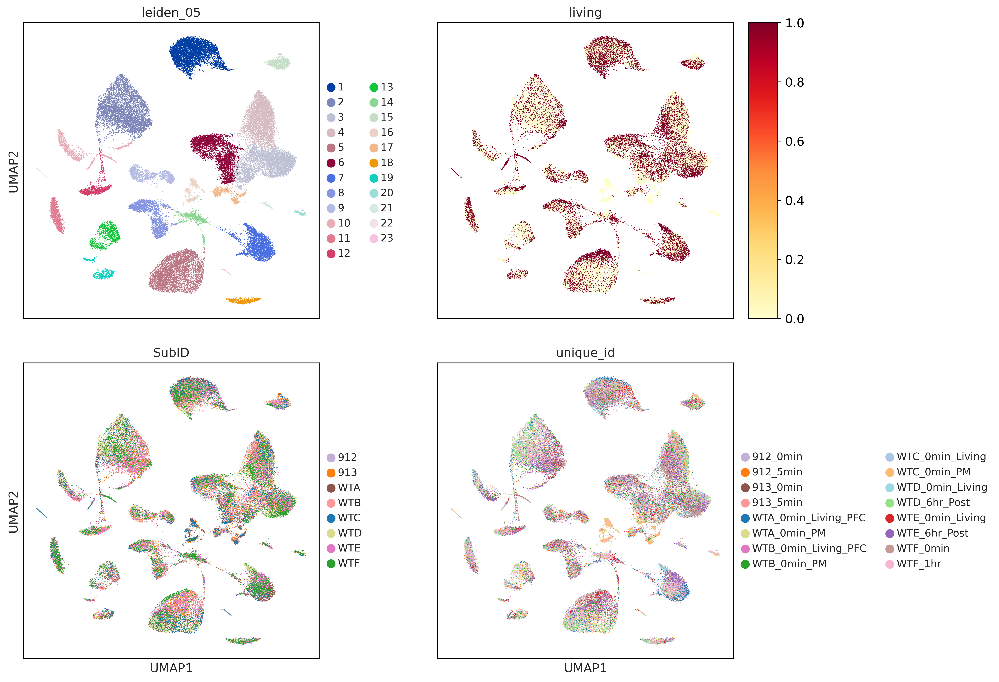

In [30]:
pg.scatter(data, attrs=['leiden_05','living', 'SubID', 'unique_id'], basis='umap', dpi=200)

### Batch correction using Harmony

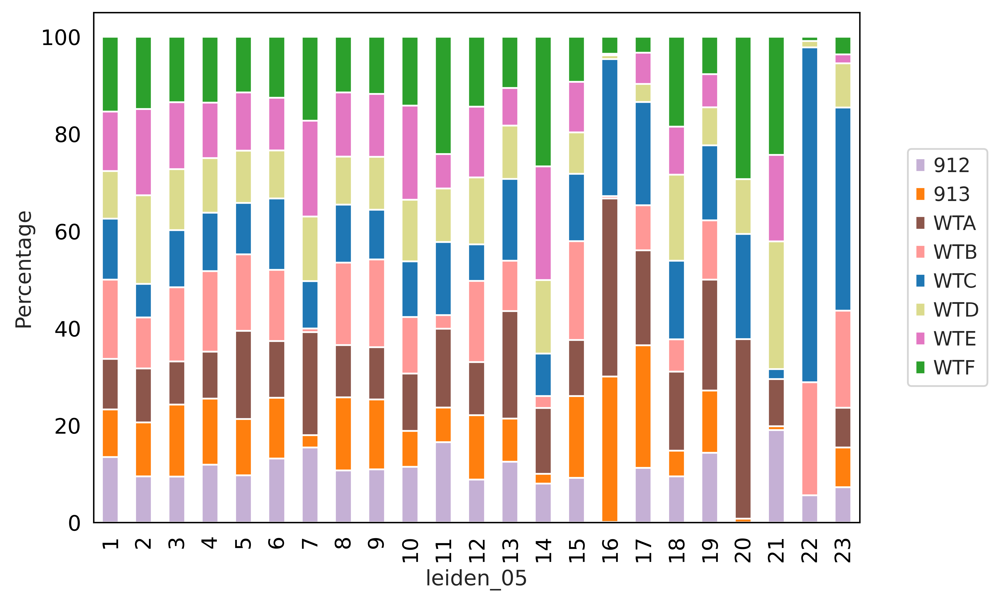

In [31]:
pg.compo_plot(data, 'leiden_05', 'SubID')

In [32]:
pca_key = pg.run_harmony(data, "SubID")

2023-08-07 10:23:26,868 - pegasus.tools.batch_correction - INFO - Start integration using Harmony.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
2023-08-07 10:29:24,318 - pegasus.tools.batch_correction - INFO - Function 'run_harmony' finished in 357.49s.


### Visualize data after batch correction

In [33]:
pg.neighbors(data, K=30, rep=pca_key)
pg.leiden(data, rep=pca_key, resolution=0.5, class_label="leiden_05")
pg.umap(data, rep=pca_key, n_neighbors=30)

2023-08-07 10:29:34,095 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 9.73s.
2023-08-07 10:29:35,137 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 1.04s.
2023-08-07 10:29:35,588 - pegasus.tools.graph_operations - INFO - Function 'construct_graph' finished in 0.45s.
2023-08-07 10:29:38,694 - pegasus.tools.clustering - INFO - Leiden clustering is done. Get 22 clusters.
2023-08-07 10:29:38,713 - pegasus.tools.clustering - INFO - Function 'leiden' finished in 3.57s.
2023-08-07 10:29:38,714 - pegasus.tools.nearest_neighbors - INFO - Found cached kNN results, no calculation is required.
2023-08-07 10:29:38,715 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 0.00s.
UMAP(min_dist=0.5, n_neighbors=30, precomputed_knn=(array([[    0, 31286, 52202, ..., 1227, 14031, 25497],
       [    1, 3007, 39189, ..., 14055, 24984, 7404],
       [    2, 86, 5663, ..., 58468, 7597, 12279],
       ..

Epochs completed: 100%| ██████████ 200/200 [01:38]

Mon Aug  7 10:31:27 2023 Finished embedding
2023-08-07 10:31:27,231 - pegasus.tools.visualization - INFO - Function 'umap' finished in 108.52s.


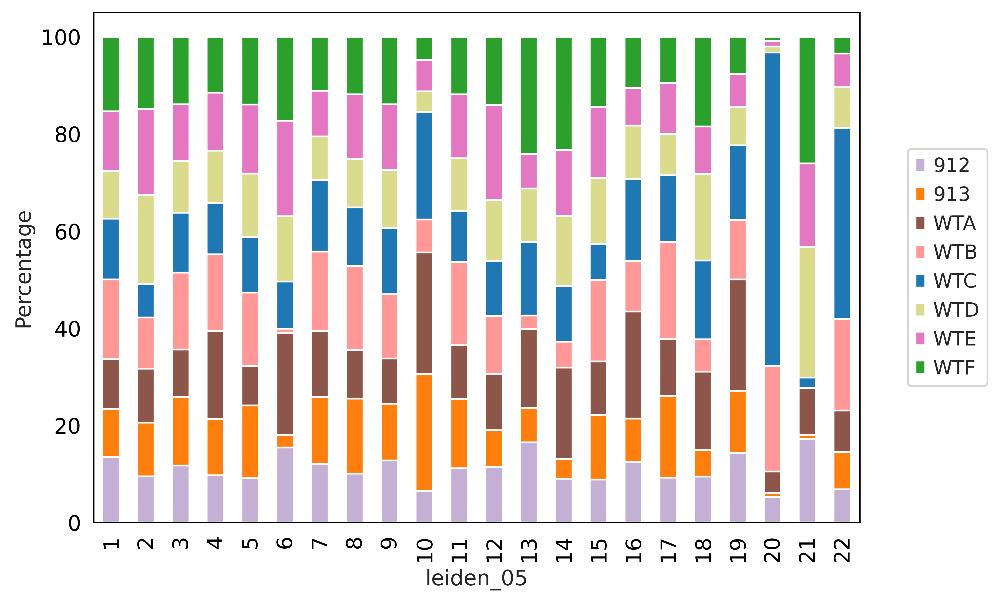

In [34]:
pg.compo_plot(data, 'leiden_05', 'SubID')

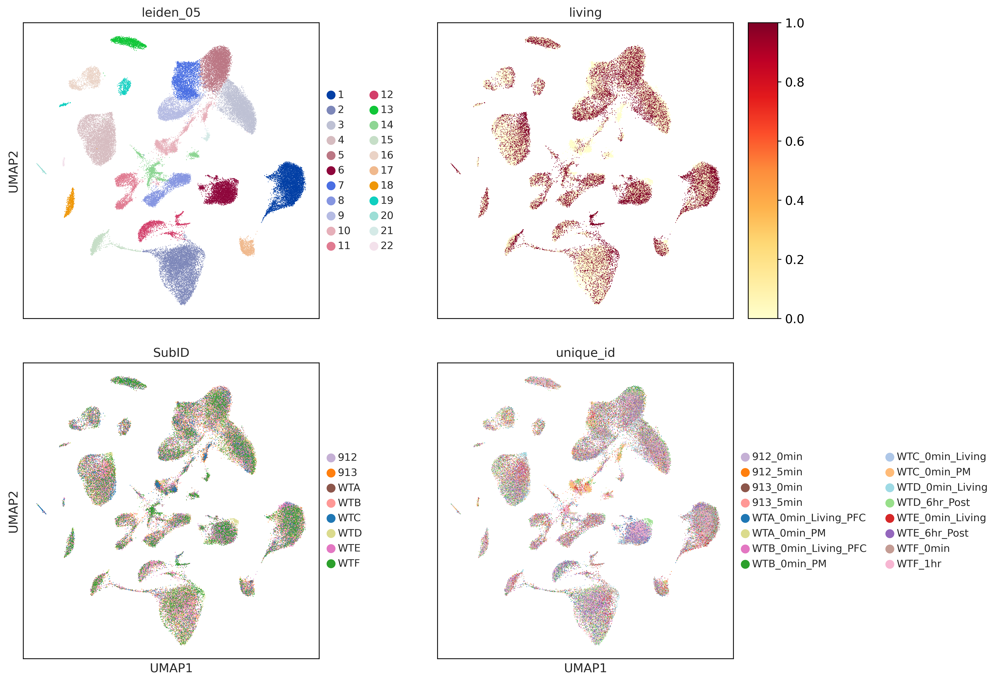

In [35]:
pg.scatter(data, attrs=['leiden_05','living', 'SubID', 'unique_id'], basis='umap', dpi=200)

### Cell annotation

In [36]:
pg.de_analysis(data, cluster="leiden_05", n_jobs=1)

2023-08-07 10:33:13,365 - pegasus.tools.diff_expr - INFO - CSR matrix is converted to CSC matrix. Time spent = 3.5083s.
calc_mwu finished for genes in [0, 23741).
2023-08-07 10:34:01,707 - pegasus.tools.diff_expr - INFO - MWU test and AUROC calculation are finished. Time spent = 48.3426s.
2023-08-07 10:34:02,205 - pegasus.tools.diff_expr - INFO - Sufficient statistics are collected. Time spent = 0.4974s.
2023-08-07 10:34:02,360 - pegasus.tools.diff_expr - INFO - Differential expression analysis is finished.
2023-08-07 10:34:02,364 - pegasus.tools.diff_expr - INFO - Function 'de_analysis' finished in 52.54s.


In [37]:
marker_dict = pg.markers(data)
celltype_dict = pg.infer_cell_types(data, markers = 'mouse_brain,human_brain')

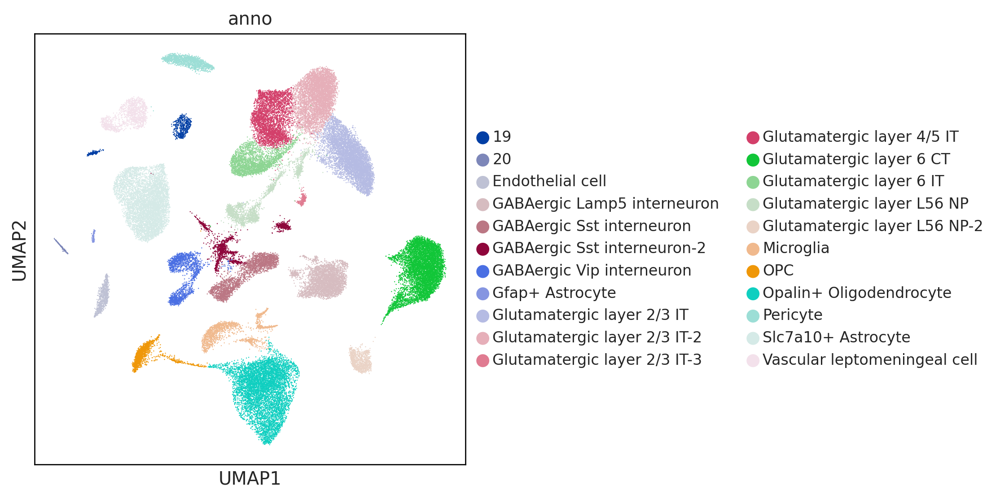

In [38]:
cluster_names = pg.infer_cluster_names(celltype_dict)
pg.annotate(data, name='anno', based_on="leiden_05", anno_dict=cluster_names)
data.obs['anno'].value_counts()
pg.scatter(data, attrs='anno', basis='umap', dpi=120)

### Number of cells for each annotated class in living and PM samples

In [39]:
living_counts = data[data.obs["living"]].obs['anno'].value_counts().to_dict()
pm_counts = data[~data.obs["living"]].obs['anno'].value_counts().to_dict()
for k in living_counts.keys():
    print(f"{k:30s}  Living: {living_counts[k]:5d}, PM: {pm_counts[k]:5d}")

Glutamatergic layer 6 CT        Living:  3917, PM:  3412
Glutamatergic layer 2/3 IT      Living:  2737, PM:  3508
Glutamatergic layer 2/3 IT-2    Living:  2589, PM:  2890
Slc7a10+ Astrocyte              Living:  2475, PM:  3657
Opalin+ Oligodendrocyte         Living:  2102, PM:  5111
GABAergic Lamp5 interneuron     Living:  2013, PM:  2011
Glutamatergic layer 4/5 IT      Living:  1600, PM:  2129
Glutamatergic layer 6 IT        Living:  1430, PM:  1278
GABAergic Sst interneuron       Living:  1406, PM:  1333
GABAergic Vip interneuron       Living:   837, PM:   947
Microglia                       Living:   748, PM:   865
Pericyte                        Living:   740, PM:   787
GABAergic Sst interneuron-2     Living:   537, PM:   959
Glutamatergic layer L56 NP-2    Living:   535, PM:   524
OPC                             Living:   520, PM:   795
Vascular leptomeningeal cell    Living:   412, PM:   897
Endothelial cell                Living:   349, PM:   465
Glutamatergic layer L56 NP     

### Add potential marker genes to the list of highly variable genes
We first collect genes from the pegasus annotation (stored in celltype_dict), along with a (overalpping, and non-exhaustive) set of marker genes from the literature, and add them to the list of highly variable genes.

In [40]:
genes_from_de = []
for c in celltype_dict.values():
    if len(c) == 0:
        continue
    c1 = str(c[0])
    while True:
        i1 = c1.find("+")
        if i1 < 0:
            break
        i0 = c1[i1-10:i1].find("(")
        genes_from_de.append(c1[i1-9+i0:i1])
        c1 = c1[i1 + 1:]

In [42]:
genes = [
    "Slc17a7", 
    "Neurod2",
    "Neurod6",
    "Car3",
    "Plp1", 
    "Cnp",
    "St18",
    "Fa2h",
    "Mbp",
    "Gja1", 
    "Prdx6",
    "Prex2",
    "Gfap",
    "Htra1", 
    "Gpr37l1", 
    "Hexb",  
    "Cx3cr1", 
    "Atp13a5", 
    "Gad1", 
    "Gad2",
    "Sst",
    "Sstr1",
    "Sstr2",
    "Vip",
    "Vipr1",
    "Vipr2",
    "Lamp5",
    "Stab1", 
    "Vtn", 
    "Mylk",
    "Emid1",
    "Pdgfra", 
    "Bmp6",
    "Ranbp3l",
    "Slc7a11",
    "Flt1", 
    "Mecom",
    "Map2",
]

genes_augmented = []
for g in genes_from_de:
    if not g in genes_augmented:
        genes_augmented.append(g)
for g in genes:
    if not g in genes_augmented:
        genes_augmented.append(g)

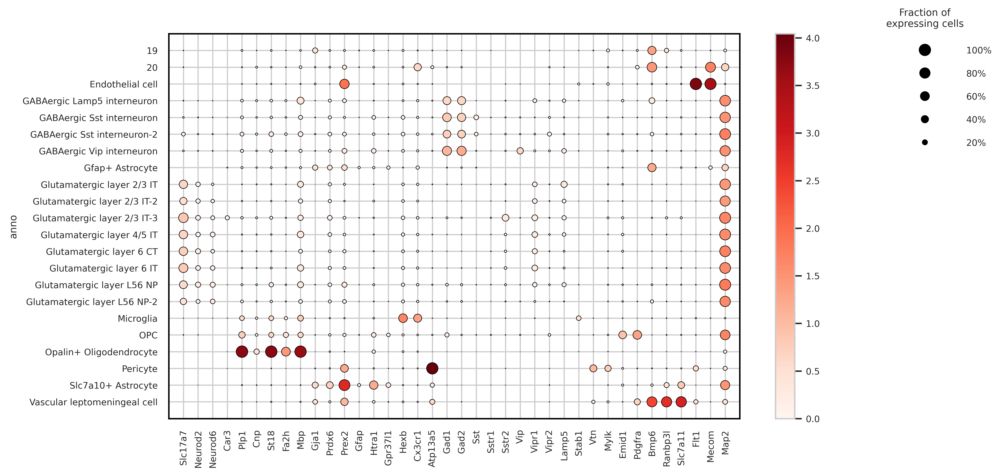

In [43]:
pg.dotplot(data, genes, "anno", dpi=250)
plt.show()

### Ensure genes of interest are added to highly_variable_features

In [217]:
for g in genes_augmented:
    if not data.var.highly_variable_features[g]:
        print(g)
        data.var.highly_variable_features[g] = True

### Save data as pre final clean

In [44]:
adata = data.to_anndata()
anndata_fn = os.path.join(save_dir, "mouse_living_brain_pre_final_clean.h5ad")
adata.write(anndata_fn)

### Remove clusters Gfap+ Astrocyte, 19, and 20, and redo the clustering and annotation

In [45]:
data.obs["passed_qc"] = (data.obs.anno != "Gfap+ Astrocyte") * (data.obs.anno != "18") * (data.obs.anno != "19") * (data.obs.anno != "20")
print(f"Mean number of cells that passed QC: {np.mean(data.obs.passed_qc):1.4f}")
pg.filter_data(data)

Mean number of cells that passed QC: 0.9829
2023-08-07 10:38:44,887 - pegasusio.qc_utils - INFO - After filtration, 59022 out of 60050 cell barcodes are kept in UnimodalData object unknown-rna.
2023-08-07 10:38:44,889 - pegasus.tools.preprocessing - INFO - Function 'filter_data' finished in 2.26s.


### Optional: rerun pipeline with after removing these cluster

In [48]:
pg.highly_variable_features(data, batch='SubID', n_top=2000)
data.var.highly_variable_features *= data.var.protein_coding
data.var.highly_variable_features *= data.var.robust_protein_coding
data.var.highly_variable_features *= (data.var.ribosomal == False)
data.var.highly_variable_features *= (data.var.mitochondrial == False)
data.var.highly_variable_features *= (data.var.mitocarta_genes == False)

for g in genes_augmented:
    if not data.var.highly_variable_features[g]:
        data.var.highly_variable_features[g] = True

2023-08-07 10:46:44,541 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 1.05s.
2023-08-07 10:46:44,645 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2023-08-07 10:46:44,647 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 1.15s.


/tmp/ipykernel_51704/3688605555.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.var.highly_variable_features[g] = True


In [47]:
pg.pca(data, n_components=30, features='highly_variable_features', standardize=True)
pca_key = pg.run_harmony(data, "SubID")
pg.neighbors(data, K=30, rep=pca_key)
pg.leiden(data, rep=pca_key, resolution=0.5, class_label="leiden_05")
pg.umap(data, rep=pca_key, n_neighbors=30)

2023-08-07 10:39:34,416 - pegasus.tools.preprocessing - INFO - Function 'pca' finished in 20.22s.
2023-08-07 10:39:34,423 - pegasus.tools.batch_correction - INFO - Start integration using Harmony.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).
2023-08-07 10:43:14,257 - pegasus.tools.batch_correction - INFO - Function 'run_harmony' finished in 219.83s.
2023-08-07 10:43:24,898 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 10.63s.
2023-08-07 10:43:25,773 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 0.87s.
2023-08-07 10:43:26,229 - pegasus.tools.graph_operations - INFO - Function 'construct_graph' finished in 0.45s.
2023-08-07 10:43:29,234 - pegasus.tools.clustering - INFO - Leiden clustering is done. Get 19 clusters.
2023-08-07 10:43:29,250 - pegasus.tools.clustering - INFO - Function 'leiden

Epochs completed: 100%| ██████████ 200/200 [02:51]

Mon Aug  7 10:46:43 2023 Finished embedding
2023-08-07 10:46:43,484 - pegasus.tools.visualization - INFO - Function 'umap' finished in 194.23s.


2023-08-07 10:50:23,735 - pegasus.tools.diff_expr - INFO - CSR matrix is converted to CSC matrix. Time spent = 3.3548s.
calc_mwu finished for genes in [0, 23741).
2023-08-07 10:51:10,762 - pegasus.tools.diff_expr - INFO - MWU test and AUROC calculation are finished. Time spent = 47.0278s.
2023-08-07 10:51:11,250 - pegasus.tools.diff_expr - INFO - Sufficient statistics are collected. Time spent = 0.4879s.
2023-08-07 10:51:11,398 - pegasus.tools.diff_expr - INFO - Differential expression analysis is finished.
2023-08-07 10:51:11,399 - pegasus.tools.diff_expr - INFO - Function 'de_analysis' finished in 51.02s.


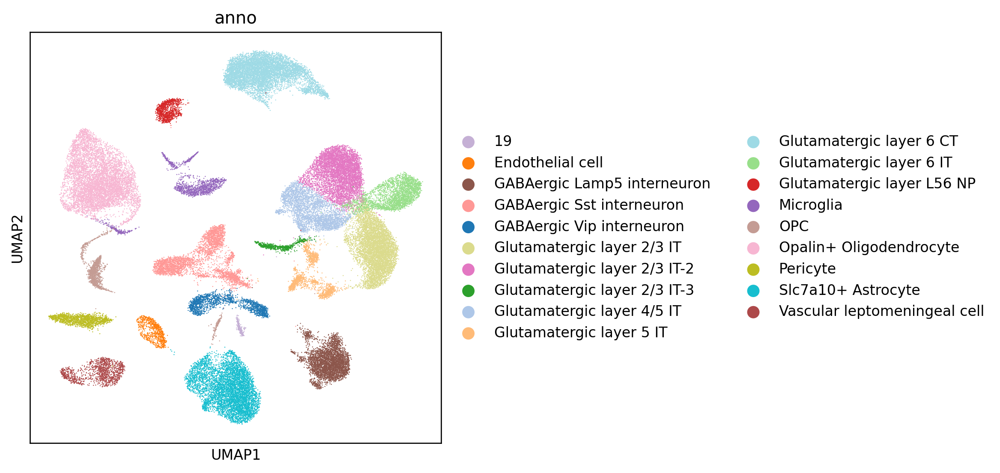

In [49]:
pg.de_analysis(data, cluster="leiden_05", n_jobs=1)
marker_dict = pg.markers(data)
celltype_dict = pg.infer_cell_types(data, markers = 'mouse_brain,human_brain')
cluster_names = pg.infer_cluster_names(celltype_dict)
pg.annotate(data, name='anno', based_on="leiden_05", anno_dict=cluster_names)
pg.scatter(data, attrs='anno', basis='umap', dpi=120)
plt.show()

In [52]:
living_counts = data[data.obs["living"]].obs['anno'].value_counts().to_dict()
pm_counts = data[~data.obs["living"]].obs['anno'].value_counts().to_dict()
for k in living_counts.keys():
    print(f"{k:30s}  Living: {living_counts[k]:5d}, PM: {pm_counts[k]:5d}")

Glutamatergic layer 6 CT        Living:  3922, PM:  3416
Glutamatergic layer 2/3 IT      Living:  2755, PM:  3541
Glutamatergic layer 2/3 IT-2    Living:  2696, PM:  2986
Slc7a10+ Astrocyte              Living:  2473, PM:  3655
Opalin+ Oligodendrocyte         Living:  2109, PM:  5110
GABAergic Lamp5 interneuron     Living:  2019, PM:  2013
GABAergic Sst interneuron       Living:  1874, PM:  1992
Glutamatergic layer 4/5 IT      Living:  1470, PM:  2001
Glutamatergic layer 6 IT        Living:  1468, PM:  1342
GABAergic Vip interneuron       Living:   838, PM:   932
Pericyte                        Living:   741, PM:   789
Microglia                       Living:   740, PM:   865
OPC                             Living:   592, PM:   865
Glutamatergic layer L56 NP      Living:   535, PM:   523
Vascular leptomeningeal cell    Living:   412, PM:   897
Endothelial cell                Living:   349, PM:   468
Glutamatergic layer 5 IT        Living:   229, PM:  1434
Glutamatergic layer 2/3 IT-3   

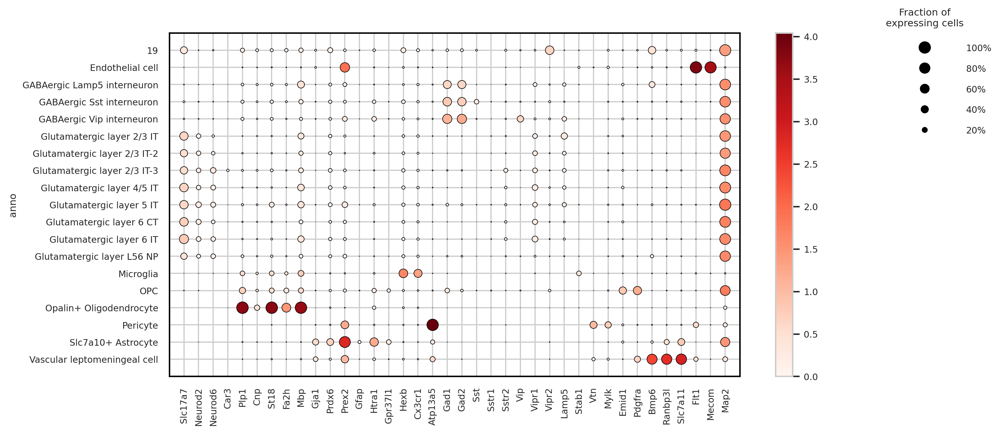

In [51]:
pg.dotplot(data, genes, "anno", dpi=140)
plt.show()

In [51]:
anndata_fn = os.path.join(save_dir, "mouse_living_brain_clean_2023_08_03.h5ad")
pg.write_output(data, anndata_fn)

2023-08-03 09:27:18,828 - pegasusio.readwrite - INFO - h5ad file '/sc/arion/work/massen06/living_brain1/anndata/mouse_living_brain_clean_2023_08_03.h5ad' is written.
2023-08-03 09:27:18,829 - pegasusio.readwrite - INFO - Function 'write_output' finished in 51.90s.
